## Primary Objective : Store Sales Forecasting (Walmart)

**Overview** : One challenge of modeling retail data is the need to make decisions based on limited history. If Christmas comes but once a year, so does the chance to see how strategic decisions impacted the bottom line.
<br>The purpose of this analysis is to use an appropriate(limited) data from a retail store to predict the extent of impact of key holidays/events on the sales of a certain category of products.
<br>Keeping the above objective in mind, the results can be evaluated using Weighted Mean Absolute Error(WMAE) where holiday week will have weight of 5 and rest will have a weight of 1.

**Data Used** : Here, we will use the historical sales data for 45 Walmart stores located in different regions. Each store contains many departments, and we will use time-series models to project the sales for one of the departments in each store. We will be using the data available on Kaggle.

Below 3 datasets will be used in our analysis:

*   **stores.csv**
<br>This file contains anonymized information about the 45 stores, indicating the type and size of store.

*   **train.csv**
<br>This is the historical training data, which covers to 2010-02-05 to 2012-11-01. Within this file you will find the following fields:
<br>Store -- the store number
<br>Dept -- the department number
<br>Date -- the week
<br>Weekly_Sales --  sales for the given department in the given store
<br>IsHoliday -- whether the week is a special holiday week

*   **features.csv**
<br>This file contains additional data related to the store, department, and regional activity for the given dates. It contains the following fields:
<br>Store -- the store number
<br>Date -- the week
<br>Temperature -- average temperature in the region
<br>Fuel_Price -- cost of fuel in the region
<br>MarkDown1-5 -- anonymized data related to promotional markdowns that Walmart is running. MarkDown data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA.
<br>CPI -- the consumer price index
<br>Unemployment -- the unemployment rate
<br>IsHoliday -- whether the week is a special holiday week




**Approach** : The planned approach is to first have an idea of the available input variables and do any preprcessing required to prepare the time-series data. Next, we analyse the time-series data for any available patterns of seasonality, trend and autocorrelation. If there is a non-stationary series we convert it to stationary and do the relevant statistical tests.
<br>The algorithms we will be using for our purpose are time-series Decomposition, ARIMA(AR/MA etc as needed based on analysis), SARIMAX(Prophet), RNN and LSTM.

### Project Initialization : Imports Libraries and Data

In [1]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.3 MB/s eta 0:00:00


In [2]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import os, math
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import ExponentialSmoothing

import pmdarima as pm
from prophet import Prophet

import warnings
warnings.filterwarnings('ignore')

In [4]:
os.chdir("/content/drive/MyDrive/Coursera - Specialized Models : Time Series and Survival Analysis (IBM Course)/Final Project/data")
os.listdir()

['train.csv', 'sampleSubmission.csv', 'features.csv', 'test.csv', 'stores.csv']

In [5]:
train = pd.read_csv('train.csv')
stores = pd.read_csv('stores.csv')
features = pd.read_csv('features.csv')

print(train.shape, stores.shape, features.shape)

(421570, 5) (45, 3) (8190, 12)


### Step 01 : Data Preparation & Exploration

In [6]:
train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [8]:
stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [9]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


In [10]:
stores[['Type']].value_counts()

Type
A       22
B       17
C        6
dtype: int64

In [11]:
features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [12]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


**Observations** : There are 2 types of stores, A & B, and multiple departments. We will be selecting only one department for our purpose, say department 4. We have missing info in features data in 'markdown' column which contains promos so we can ignore in our current analysis, same for CPI and unemployment rate.
<br>Now, we merge the required info in a single data and set date column as datetime index of weekly frequency.

In [13]:
train_Dept4 = train[train['Dept']==4]
train_Dept4.shape

(6435, 5)

In [14]:
train_Dept4_merge1 = train_Dept4.merge(stores, how='left', on='Store')
train_Dept4_merge2 = train_Dept4_merge1.merge(features[['Store', 'Date', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']], how='left', on=['Store', 'Date'])
train_Dept4_merge1.shape, train_Dept4_merge2.shape

((6435, 7), (6435, 11))

In [15]:
train_Dept4_merge2.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,CPI,Unemployment
0,1,4,2010-02-05,39954.04,False,A,151315,42.31,2.572,211.096358,8.106
1,1,4,2010-02-12,35351.21,True,A,151315,38.51,2.548,211.242170,8.106
2,1,4,2010-02-19,36826.95,False,A,151315,39.93,2.514,211.289143,8.106
3,1,4,2010-02-26,34660.16,False,A,151315,46.63,2.561,211.319643,8.106
4,1,4,2010-03-05,38086.19,False,A,151315,46.50,2.625,211.350143,8.106


In [16]:
train_Dept4_merge2['Date'] = train_Dept4_merge2['Date'].apply(pd.to_datetime)

In [17]:
train_Dept4_merge2.dtypes

Store                    int64
Dept                     int64
Date            datetime64[ns]
Weekly_Sales           float64
IsHoliday                 bool
Type                    object
Size                     int64
Temperature            float64
Fuel_Price             float64
CPI                    float64
Unemployment           float64
dtype: object

In [18]:
train_Dept4_merge2.set_index('Date', inplace=True)
train_Dept4_merge2.index

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', name='Date', length=6435, freq=None)

In [19]:
# Time Series data is now prepared
train_Dept4_merge2.head()

,Store,Dept,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,,,,
2010-02-05,1,4,39954.04,False,A,151315,42.31,2.572,211.096358,8.106
2010-02-12,1,4,35351.21,True,A,151315,38.51,2.548,211.242170,8.106
2010-02-19,1,4,36826.95,False,A,151315,39.93,2.514,211.289143,8.106
2010-02-26,1,4,34660.16,False,A,151315,46.63,2.561,211.319643,8.106
2010-03-05,1,4,38086.19,False,A,151315,46.50,2.625,211.350143,8.106


In [20]:
print("Unique stores available for department 4 in the data : ", train_Dept4_merge2['Store'].nunique())

Unique stores available for department 4 in the data :  45


In [21]:
# Checking for any missing dates considering this is a weekly data.
print('Unique dates in our data: ', len(train_Dept4_merge2.index.unique()), 'Dates')
our_date_range = train_Dept4_merge2.index.max() - train_Dept4_merge2.index.min()

# Calculate number of weeks in date range
print('Total days in our date range:', 1 + our_date_range.days/7, 'Weeks')

Unique dates in our data:  143 Dates
Total days in our date range: 143.0 Weeks


In [22]:
# Checking for any missing dates in each of the stores
datesperstore = train_Dept4_merge2.groupby(['Store']).apply(lambda x : x.index.nunique()).reset_index().rename(columns={0:'nrows'})
datesperstore[datesperstore['nrows'] != 143]

,Store,nrows


**Observations** : Our time-series data with weekly frequency is prepared now. The index is datetime and our goal is to predict 'Weekly_Sales' for all the 45 stores of department 4. Also, We don't have any missing data for any of the stores of department 4. We have a total of 45 time-series to predict, one for each store.
<br> Now, we pivot the data to create separate columns for all stores. We are ignoring other columns to get a simple baseline model ready without any other column available. We also need to set the frequency(W) on the datetime index.
<br>  Lastly, we have roughly 2.75 years of data so we keep 115 weeks(~80%) for model development and rest for prediction.

In [23]:
sales_pivot = train_Dept4_merge2.pivot(columns='Store', values='Weekly_Sales')
sales_pivot.index = pd.date_range(sales_pivot.index.min(), sales_pivot.index.max(), freq='W-FRI')
sales_pivot.shape

(143, 45)

In [24]:
sales_pivot.index

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', length=143, freq='W-FRI')

In [25]:
# Generating train/test split for our project
project_train = sales_pivot[sales_pivot.index <= sales_pivot.index.min() + timedelta(weeks=114)].copy()
project_test = sales_pivot[sales_pivot.index > sales_pivot.index.min() + timedelta(weeks=114)].copy()
project_train.index.nunique(), project_test.index.nunique()

(115, 28)

In [26]:
project_train.head()

Store,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
2010-02-05,39954.04,47681.96,8495.10,59554.57,9282.86,35192.87,13418.73,21759.76,17483.90,51885.86,...,13071.49,17373.04,9527.93,38229.52,23906.14,25669.70,14521.55,20017.80,6516.95,28764.16
2010-02-12,35351.21,44197.95,8489.46,54069.82,9266.08,30612.26,12917.37,19921.07,15667.00,49359.18,...,12291.06,16497.53,9259.81,35728.26,21778.87,23058.98,13918.50,20066.82,6857.54,17979.14
2010-02-19,36826.95,46131.14,7824.13,53939.17,9595.35,31553.54,12230.31,20303.28,15069.46,50350.28,...,12410.71,16875.65,8998.43,35724.85,21779.47,23127.82,13333.03,19619.18,6250.25,24204.04
2010-02-26,34660.16,42126.71,8012.43,54687.08,9297.39,30353.02,12838.59,18821.94,15537.55,51206.84,...,11940.58,17080.38,9680.62,36742.97,20609.53,23862.61,14064.59,18273.88,6534.83,22497.50
2010-03-05,38086.19,46937.81,8511.73,56959.02,9610.15,35574.46,12439.00,21336.02,16630.68,50641.43,...,11715.26,16437.94,10118.61,36039.46,25311.53,25160.15,14562.58,19857.09,6588.98,23319.56


### Step 02(a) : Time-Series Exploration [Test for Stationarity]

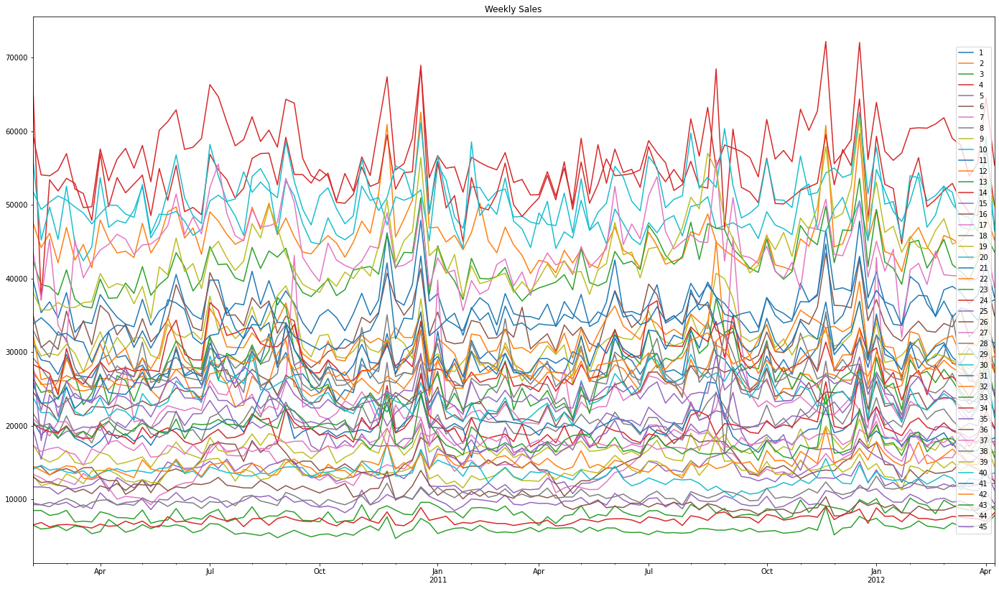

In [27]:
project_train.plot(figsize=(24,14), title='Weekly Sales').legend(loc='right')

**Observations** : We cannot make much out of this weekly plot. It seems some of the stores have a pretty much stable mean and stddev and rest have high variations/mild trend so it could be that we have multiple non-stationary time-series.
<br> So, we need to plot monthly/quaterly plots; smoothened monthly plot; test all the columns for stationarity. Some of these might be heteroscedastic, so we check that as well. We will also plot acf/pacf/monthly & quaterly seasonality using statsmodels library.

<Axes: title={'center': 'Quaterly Sales'}>

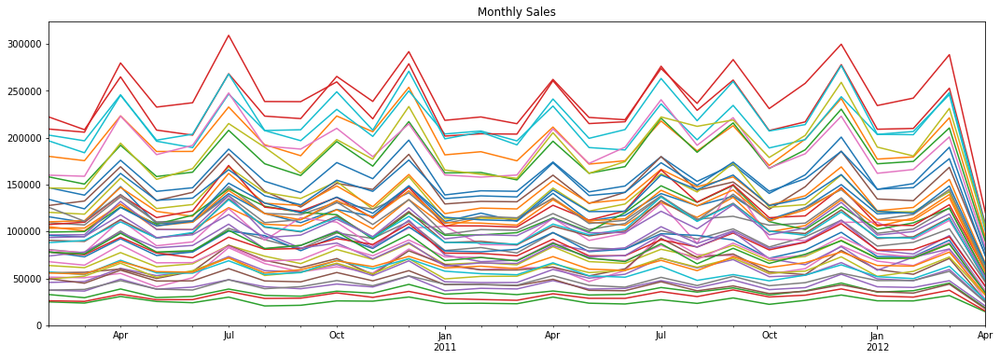

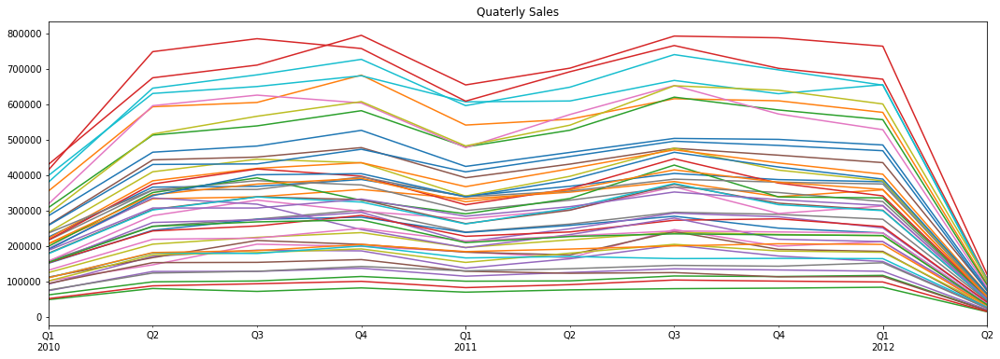

In [28]:
# Resample to monthly/quaterly and plot the sales

sales_monthly = project_train.resample('M').sum()
sales_quaterly = project_train.resample('Q').sum()

sales_monthly.plot(figsize=(18,6), title='Monthly Sales', legend=False)
sales_quaterly.plot(figsize=(18,6), title='Quaterly Sales', legend=False)

<Axes: title={'center': 'Monthly Sales (smoothened)'}>

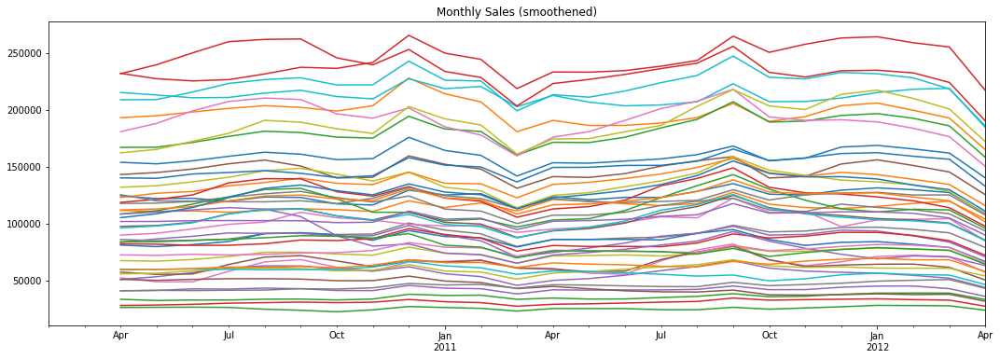

In [29]:
# Plot the smoothened monthly data with rolling mean of 3 months

window_size = 3
rolling_window_monthly = sales_monthly.rolling(window_size).mean()

rolling_window_monthly.plot(figsize=(18,6), title='Monthly Sales (smoothened)', legend=False)

In [30]:
def plot_tsanalysis(df):
    '''
    Input dataframe 'df' has weekly data for 45 stores. Monthly and Quaterly will be created within this function.
    This plots acf, pacf, monthly seasonality and quaterly seasonality plots for all the 45 stores.
    '''

    for i in range(1,46):
        df_monthly = df.resample('M').sum()
        df_quaterly = df.resample('Q').sum()

        fig, axes = plt.subplots(1, 4, figsize=(25, 4))

        plot1 = plot_acf(df[i], lags=20, title='Autocorrelation Store ' + str(i), ax=axes[0])
        plot2 = plot_pacf(df[i], lags=20, title='Partial Autocorrelation Store ' + str(i), ax=axes[1])
        plot3 = month_plot(df_monthly[i], ax=axes[2]); axes[2].set_title('Monthly Seasonality Store ' + str(i))
        plot4 = quarter_plot(df_quaterly[i], ax=axes[3]); axes[3].set_title('Quaterly Seasonality Store ' + str(i))

        fig.tight_layout()


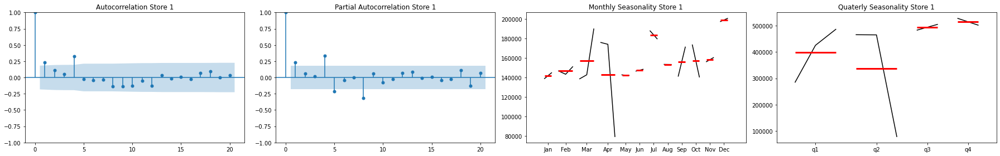

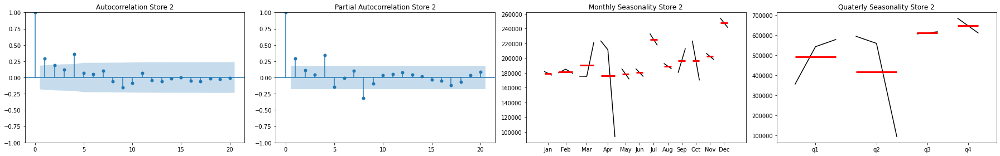

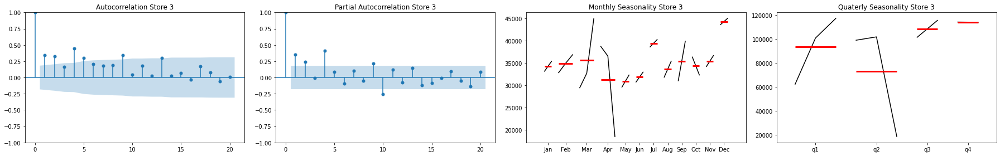

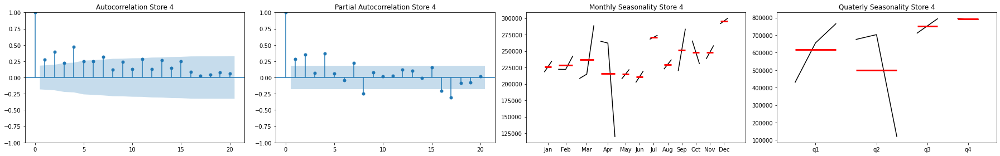

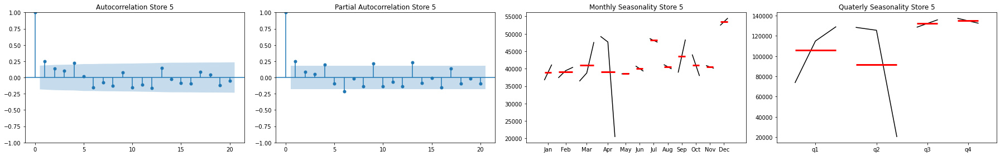

...

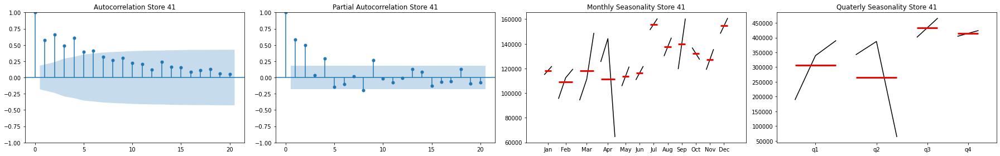

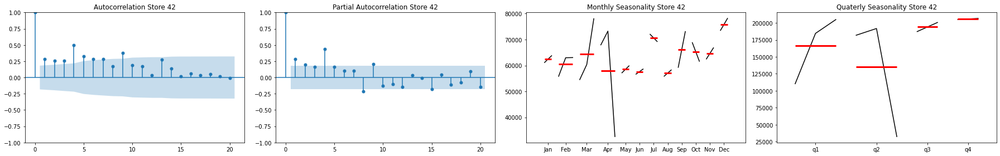

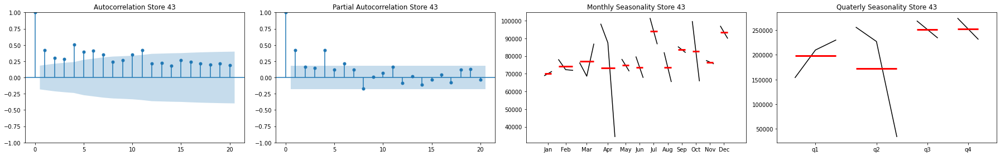

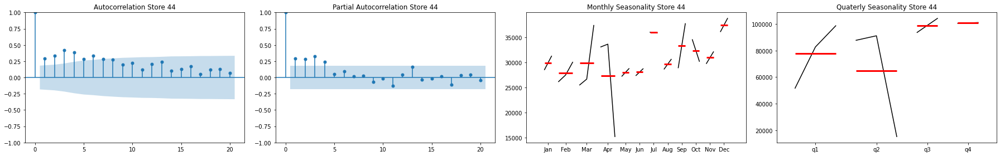

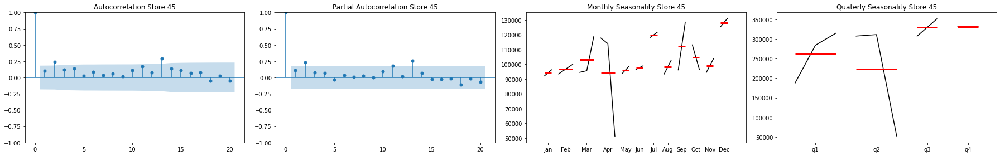

In [31]:
plot_tsanalysis(project_train)

**Observations** : From the above plots we see April has outlier value for the third year which causes quarter 2 values to vary a lot in almost all of the stores. For some of the stores there seems to be a pattern of growing sales going from January to December.
<br> No consistent seasonality can be determined from above as some months/quarters seem to have a lot of variability. Also, a few stores seem to have non-constant autocorrelated values, hence must be non-stationary.

In [32]:
# Below is a deprecatred version of function 'check_stationarity'.

# def check_stationarity(df, pval=0.05):
#     '''
#     Input dataframe 'df' has weekly data for 45 stores.
#     Uses Augmented Dickey-Fuller test in which null hypothesis is that the series is non-stationary.By default, we reject null hypothesis at p-value of 0.05%.
#     '''
#     adf=list(); pvalue=list(); critical_values01=list(); critical_values05=list(); critical_values10=list()

#     for i in range(1,46):
#         ts = df[i]
#         adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(ts)
#         adf.append(adf_tmp); pvalue.append(pvalue_tmp)
#         critical_values01.append(critical_values_tmp['1%']); critical_values05.append(critical_values_tmp['5%']); critical_values10.append(critical_values_tmp['10%'])
    
#     adf_check = pd.DataFrame({
#         'store':list(range(1,46)), 'adf':adf, 'pvalue':pvalue, 'criticalval_01':critical_values01, 'criticalval_05':critical_values05, 'criticalval_10':critical_values10
#     })
#     adf_check['stationary'] = adf_check.apply(lambda x : 'Stationary' if x.pvalue<=pval else 'Non Stationary', axis=1)
#     return adf_check

In [33]:
def check_stationarity(df, pval=0.05):
    '''
    Input dataframe 'df' has columns containing weekly data for multiple stores.
    Uses Augmented Dickey-Fuller test in which null hypothesis is that the series is non-stationary.By default, we reject null hypothesis at p-value of 0.05%.
    '''
    adf=list(); pvalue=list(); critical_values01=list(); critical_values05=list(); critical_values10=list()

    n_stores = len(df.columns) - 1

    for i in range(n_stores + 1):
        ts_col = df.columns[i]
        ts = df[ts_col]
        adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(ts)
        adf.append(adf_tmp); pvalue.append(pvalue_tmp)
        critical_values01.append(critical_values_tmp['1%']); critical_values05.append(critical_values_tmp['5%']); critical_values10.append(critical_values_tmp['10%'])
    
    adf_check = pd.DataFrame({
        'ts_col':list(df.columns), 'adf':adf, 'pvalue':pvalue, 'criticalval_01':critical_values01, 'criticalval_05':critical_values05, 'criticalval_10':critical_values10
    })
    adf_check['stationary'] = adf_check.apply(lambda x : 'Stationary' if x.pvalue<=pval else 'Non Stationary', axis=1)
    return adf_check

In [34]:
adf_check = check_stationarity(project_train, pval=0.05)
adf_check['stationary'].value_counts()

Non Stationary    23
Stationary        22
Name: stationary, dtype: int64

In [35]:
storelist_nonst = list(adf_check[adf_check['stationary']=='Non Stationary']['ts_col'])
storelist_st = list((adf_check[adf_check['stationary']=='Stationary']['ts_col']))

# stores with non-stationary time series
print("Stores with Non Stationary time series :",list(adf_check[adf_check['stationary']=='Non Stationary']['ts_col']))

Stores with Non Stationary time series : [3, 4, 5, 9, 10, 12, 13, 14, 18, 24, 28, 30, 31, 33, 35, 36, 37, 38, 39, 41, 42, 43, 44]


**Observations** : Based on ADF test at p-value of 5%, half of the time series are non-stationary. Since heteroscedastic time-series can sometimes have misleading ADF test results we check this now along with distribution of values in each time series.

In [36]:
def check_tsdist(df):
    '''
    Input dataframe 'df' has weekly data for stores in columns.
    This function plots distribution of values in each time series; and plots mean and variance in consecutive periods of time.
    '''

    n_stores = len(df.columns) - 1

    for i in range(n_stores+1):
        store_id = df.columns[i]
        chunks = np.split(df.iloc[:,i][:-5], 10)    # take only 110 values to get 10 equal splits by neglecting last 5 values.
        mean10 = np.mean(chunks, axis=1)
        var10 = np.var(chunks, axis=1)

        pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
        plt.figure(figsize = (3*pltx, plty))

        plt.subplot(131)
        df[store_id].hist(bins=20); plt.title("Sales Distribution in Store"+str(store_id))
        plt.subplot(132)
        plt.plot(mean10); plt.title("Mean for Store"+str(store_id)); plt.ylim(0)
        plt.subplot(133)
        plt.plot(var10); plt.title("Var for Store"+str(store_id)); plt.ylim(0)
        plt.tight_layout()

    plt.tight_layout()

Time Series with Non-Stationary appearance as per ADF test


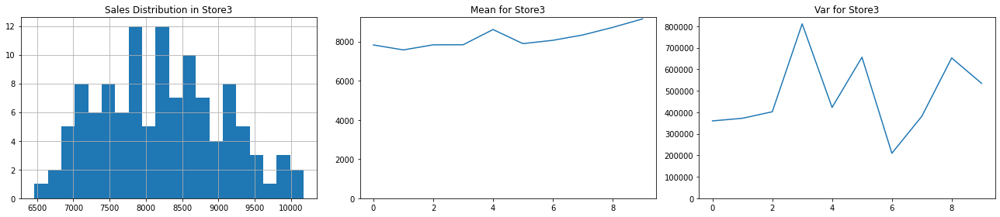

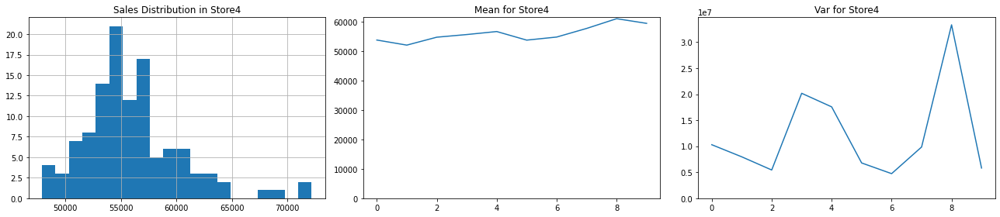

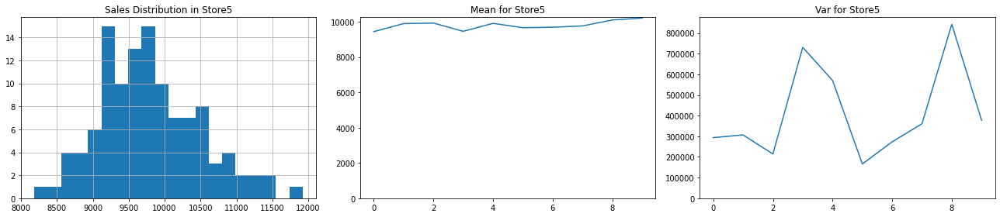

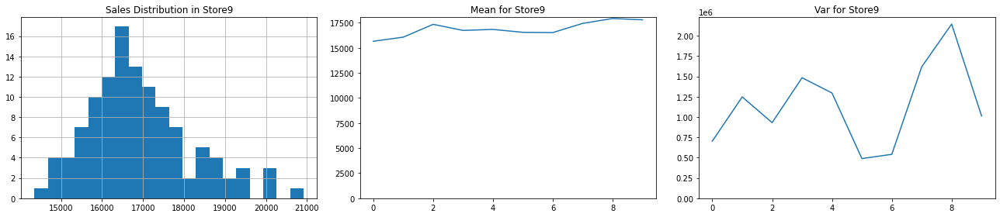

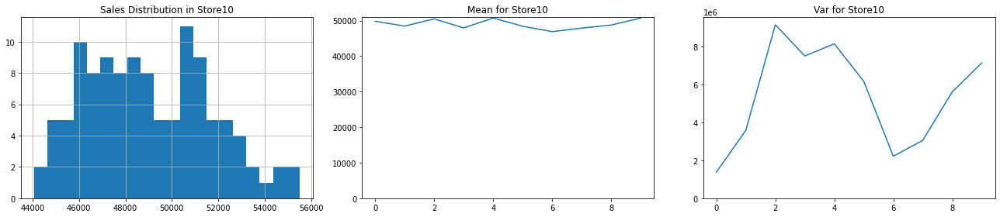

...

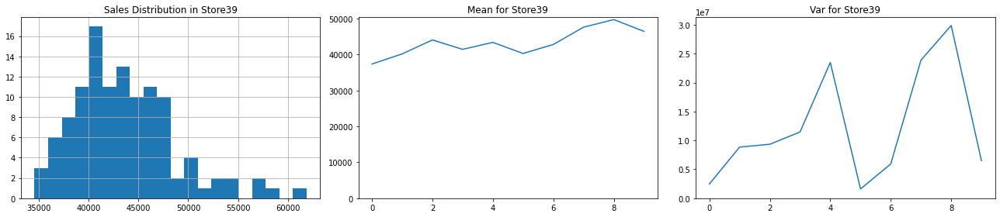

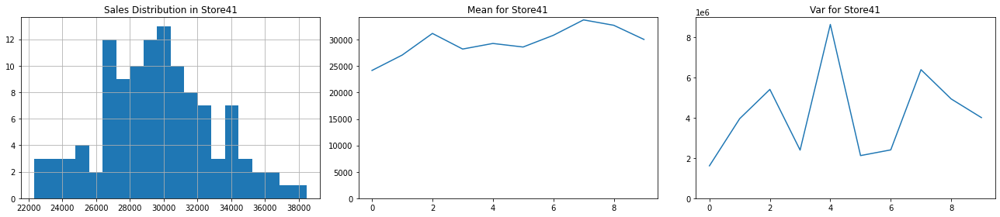

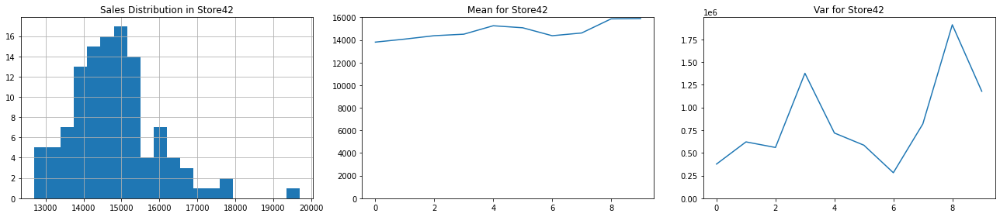

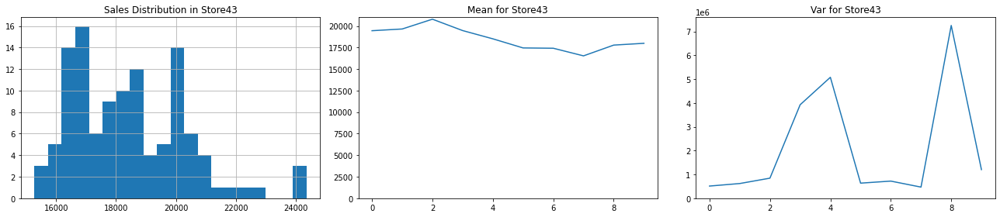

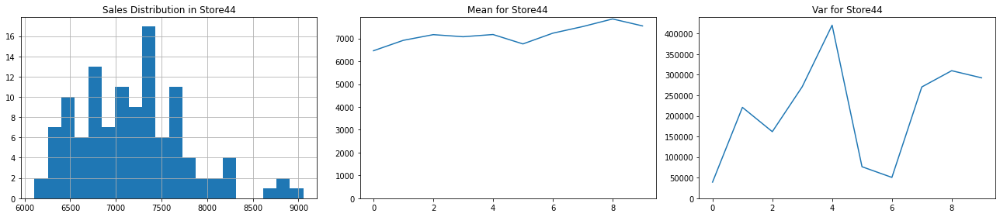

In [37]:
print("Time Series with Non-Stationary appearance as per ADF test")
check_tsdist(project_train[storelist_nonst])

Time Series with Stationary appearance as per ADF test


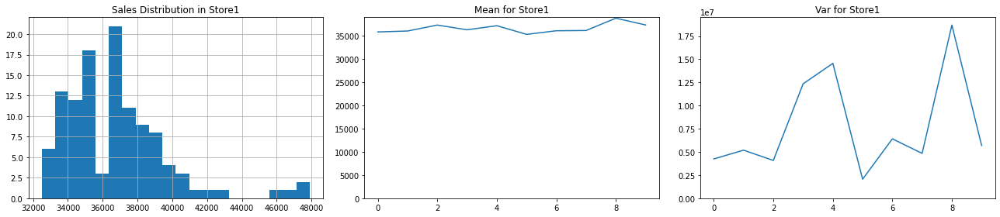

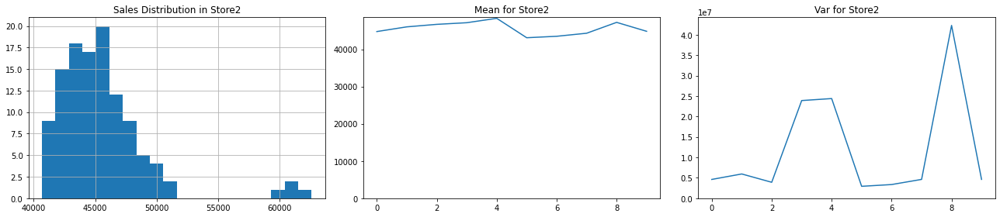

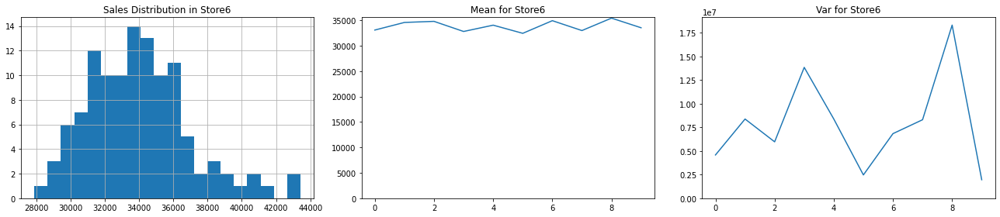

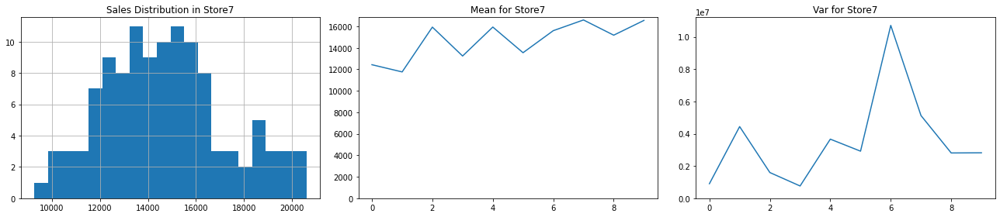

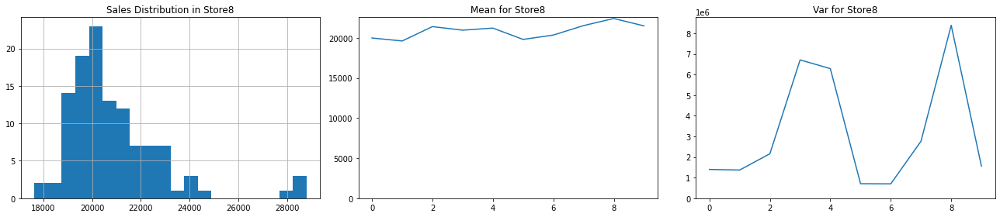

...

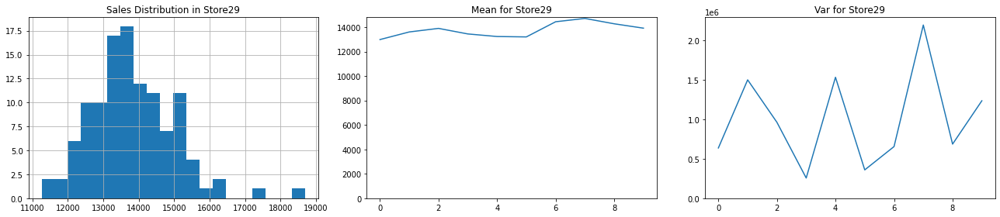

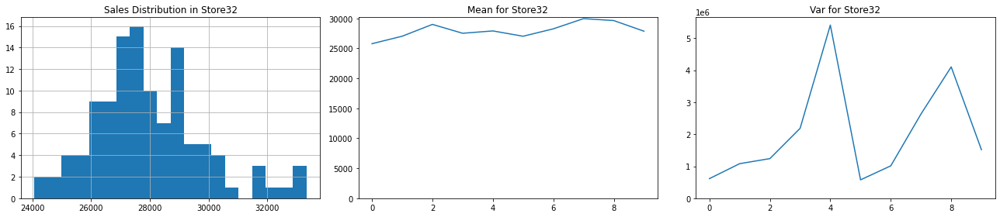

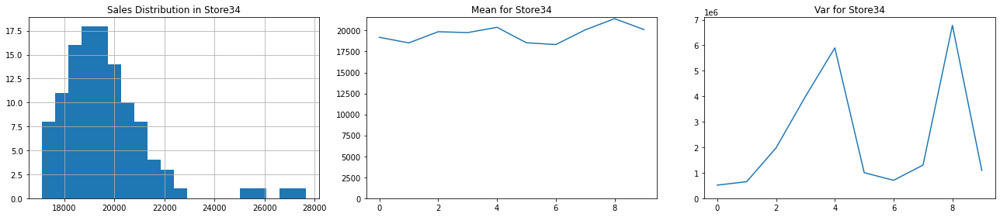

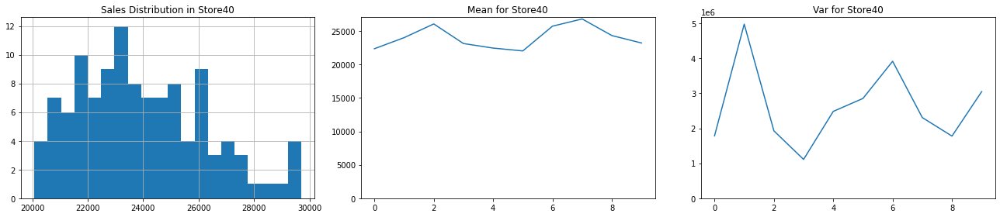

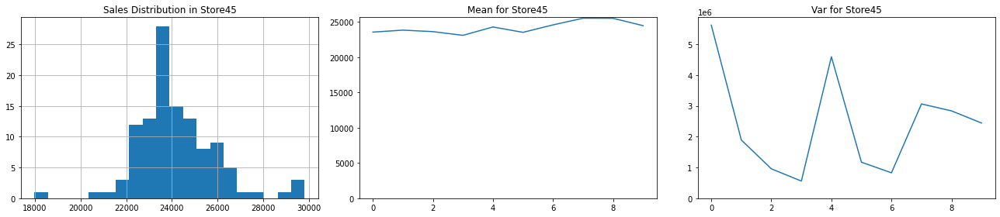

In [38]:
print("Time Series with Stationary appearance as per ADF test")
check_tsdist(project_train[storelist_st])

**Observations** : The time-series that are `non-stationary`(as per ADF test) have slight trend in some cases and heteroscedasticity in almost all the cases which could be due to the seasonality. *For these stores, we can try additive seasonal decomposition method with annual seasonality.*
<br> The time-series that are `stationary`(as per ADF test) have a stable mean; pretty much normal distribution with some outliers(perhaps also resulting in unstable variance). In these cases heteroscedasticity could be from these outliers. *For these stores, we can try log transformation to remove the outliers.*

### Step 02(b) : Time-Series Exploration [Non-Stationary to Stationary Conversion]

Before : ADF:  -2.454022738682097
Before : p-value:  0.12706548016774366
Before : Critical Values:  {'1%': -3.490683082754047, '5%': -2.8879516565798817, '10%': -2.5808574442009578}
After : ADF:  -11.006182748939171
After : p-value:  6.495391012634406e-20
After : Critical Values:  {'1%': -3.489057523907491, '5%': -2.887246327182993, '10%': -2.5804808802708528}


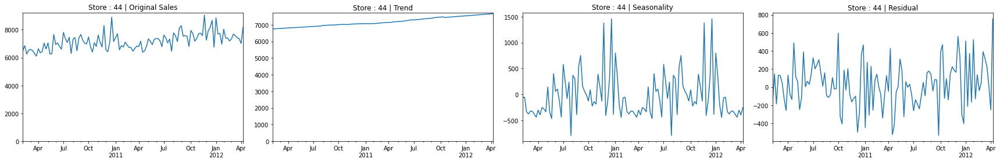

In [39]:
# Sample decomposition before applying the same process on all stores in 'storelist_nonst'

store_id = 44

adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(project_train[store_id])
print("Before : ADF: ", adf_tmp)
print("Before : p-value: ", pvalue_tmp)
print("Before : Critical Values: ", critical_values_tmp)

ss_decomposition = seasonal_decompose(x=project_train[store_id], model='additive', period=52, two_sided=True, extrapolate_trend='freq')
est_trend = ss_decomposition.trend
est_seasonal = ss_decomposition.seasonal
est_residual = ss_decomposition.resid

pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
plt.figure(figsize = (4*pltx, plty))

plt.subplot(141)
project_train[store_id].plot(); plt.title("Store : "+str(store_id)+" | Original Sales"); plt.ylim(0)
plt.subplot(142)
est_trend.plot(); plt.title("Store : "+str(store_id)+" | Trend"); plt.ylim(0)
plt.subplot(143)
est_seasonal.plot(); plt.title("Store : "+str(store_id)+" | Seasonality")
plt.subplot(144)
est_residual.plot(); plt.title("Store : "+str(store_id)+" | Residual")
plt.tight_layout()

adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(est_residual)
print("After : ADF: ", adf_tmp)
print("After : p-value: ", pvalue_tmp)
print("After : Critical Values: ", critical_values_tmp)

Before : ADF:  -2.454022738682097
Before : p-value:  0.12706548016774366
Before : Critical Values:  {'1%': -3.490683082754047, '5%': -2.8879516565798817, '10%': -2.5808574442009578}
After : ADF:  -5.590719993622313
After : p-value:  1.3310522709769372e-06
After : Critical Values:  {'1%': -3.5463945337644063, '5%': -2.911939409384601, '10%': -2.5936515282964665}


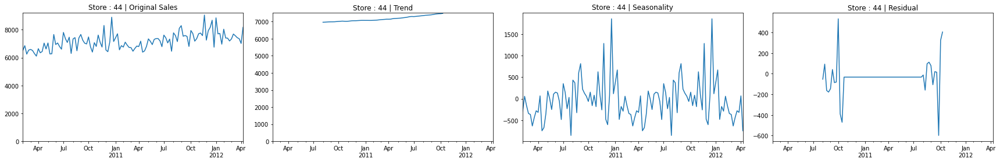

In [40]:
# Sample decomposition before applying the same process on all stores in 'storelist_nonst'

store_id = 44

adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(project_train[store_id])
print("Before : ADF: ", adf_tmp)
print("Before : p-value: ", pvalue_tmp)
print("Before : Critical Values: ", critical_values_tmp)

ss_decomposition = seasonal_decompose(x=project_train[store_id], model='additive', period=52, two_sided=True)
est_trend = ss_decomposition.trend
est_seasonal = ss_decomposition.seasonal
est_residual = ss_decomposition.resid

pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
plt.figure(figsize = (4*pltx, plty))

plt.subplot(141)
project_train[store_id].plot(); plt.title("Store : "+str(store_id)+" | Original Sales"); plt.ylim(0)
plt.subplot(142)
est_trend.plot(); plt.title("Store : "+str(store_id)+" | Trend"); plt.ylim(0)
plt.subplot(143)
est_seasonal.plot(); plt.title("Store : "+str(store_id)+" | Seasonality")
plt.subplot(144)
est_residual.plot(); plt.title("Store : "+str(store_id)+" | Residual")
plt.tight_layout()

adf_tmp, pvalue_tmp, _, _, critical_values_tmp, _ = adfuller(est_residual.dropna())
print("After : ADF: ", adf_tmp)
print("After : p-value: ", pvalue_tmp)
print("After : Critical Values: ", critical_values_tmp)

**Observations** : We can try options like model(additive/multiplicative), two_sided(True/False) and extrapolate_trend(freq/no value) by re-running above two cells multiple times. It seems true_sided=False does not solve the problem. Additive model makes more sense as already evident from the previous analysis. We can leave extrapolate_trend out and it will still do the job but do keep in mind that second approach shown above has a residual that seems heteroscedastic in a very obvious way.

In [41]:
est_trend =dict(); est_seasonal =dict(); est_residual =dict()

def addts_decompose(df):
    '''
    Input dataframe 'df' has weekly data for stores in columns.
    This function plots the trend/seasonality/residual components of providd time series using additive decomposition.
    '''

    n_stores = len(df.columns) - 1

    for i in range(n_stores+1):
        store_id = df.columns[i]
        ss_decomposition = seasonal_decompose(x=df[store_id], model='additive', period=52, two_sided=True, extrapolate_trend='freq')
        est_trend.update({store_id:ss_decomposition.trend}); est_seasonal.update({store_id:ss_decomposition.seasonal}); est_residual.update({store_id:ss_decomposition.resid})

        pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
        plt.figure(figsize = (4*pltx, plty))

        plt.subplot(141)
        df[store_id].plot(); plt.title("Store : "+str(store_id)+" | Original Sales"); plt.ylim(0)
        plt.subplot(142)
        ss_decomposition.trend.plot(); plt.title("Store : "+str(store_id)+" | Trend"); plt.ylim(0)
        plt.subplot(143)
        ss_decomposition.seasonal.plot(); plt.title("Store : "+str(store_id)+" | Seasonality")
        plt.subplot(144)
        ss_decomposition.resid.plot(); plt.title("Store : "+str(store_id)+" | Residual")
        plt.tight_layout()

    plt.tight_layout()

Time Series with Non-Stationary appearance as per ADF test


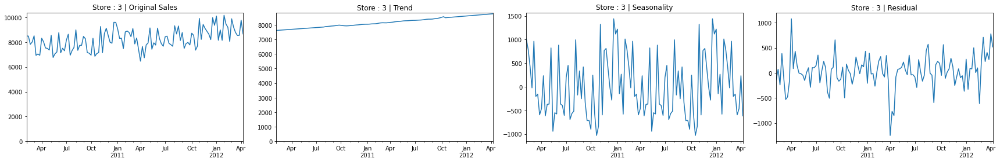

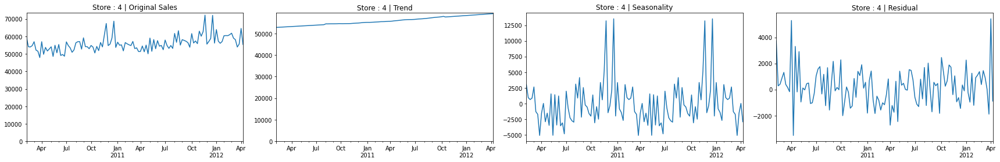

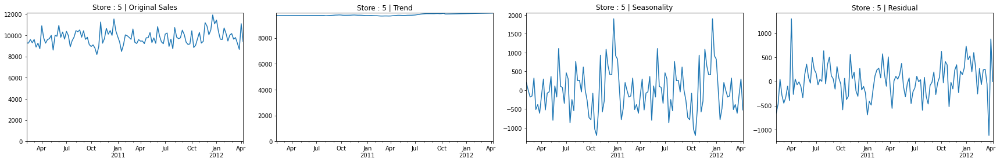

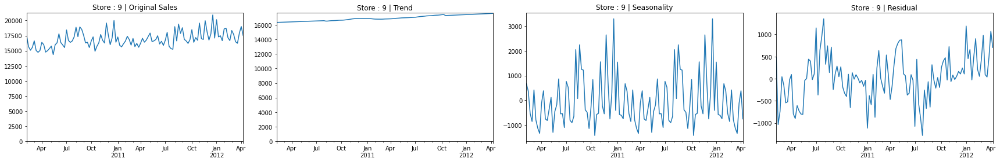

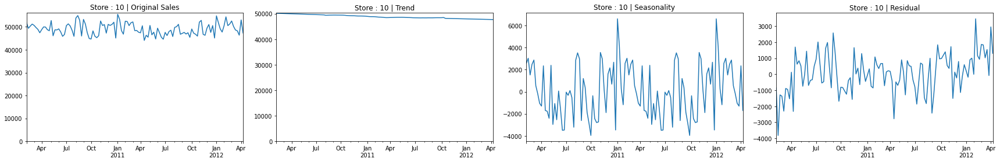

...

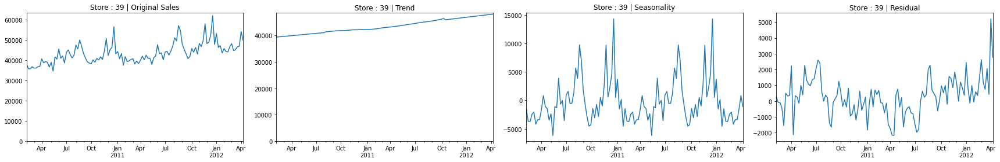

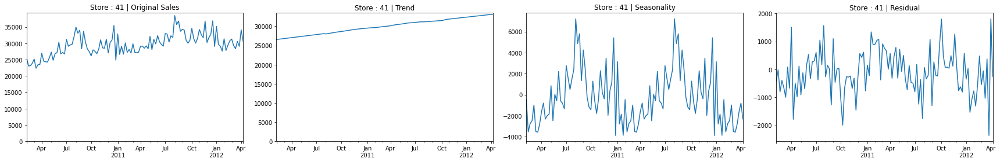

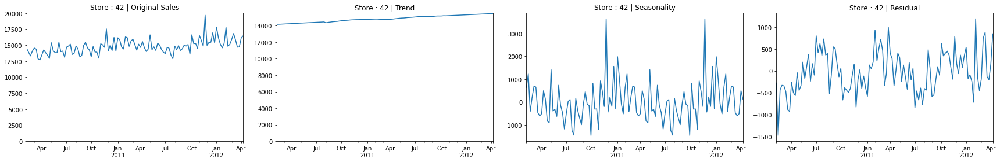

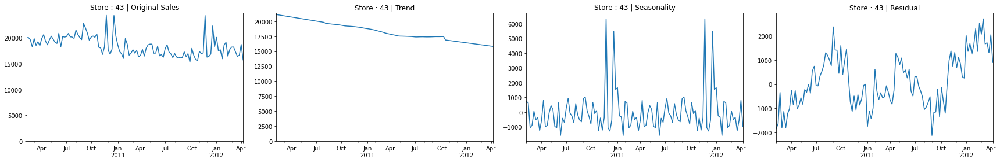

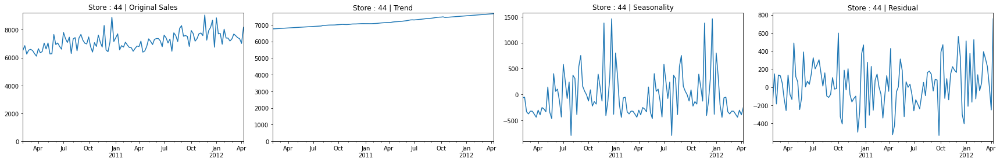

In [42]:
print("Time Series with Non-Stationary appearance as per ADF test")
addts_decompose(project_train[storelist_nonst])

Time Series with Stationary appearance as per ADF test


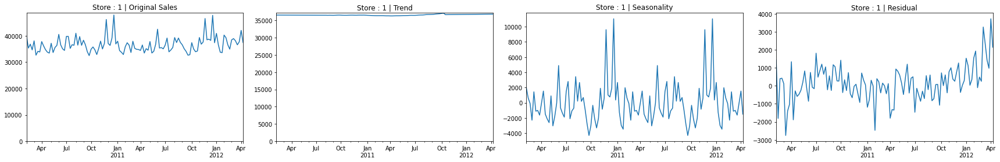

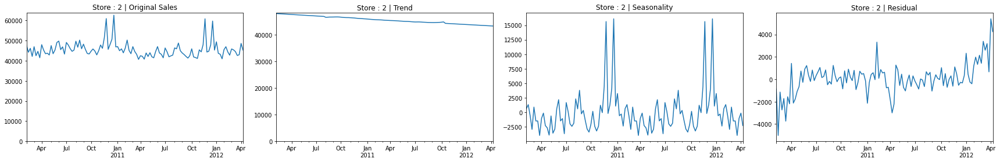

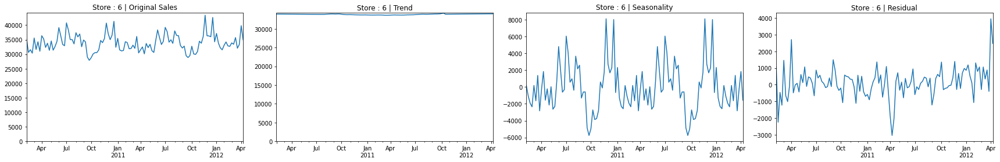

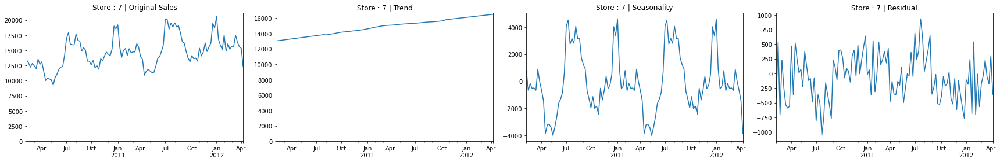

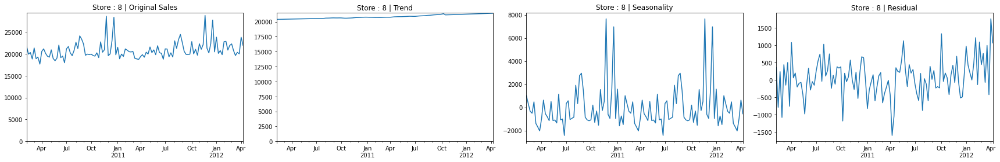

...

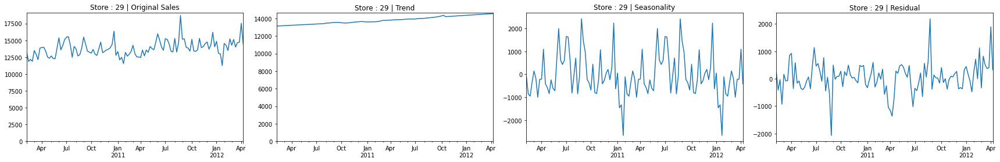

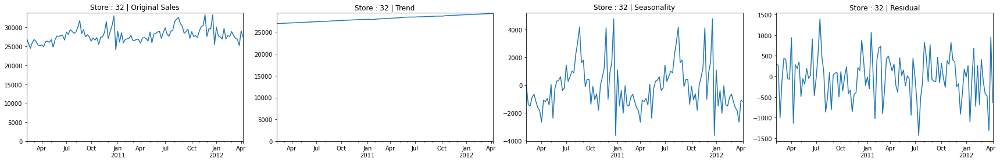

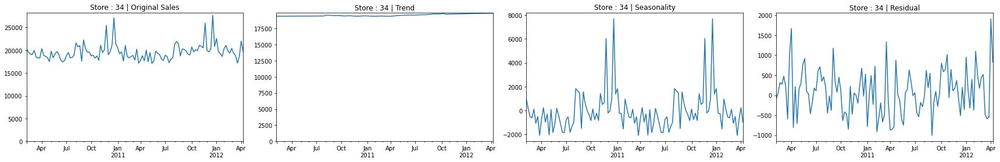

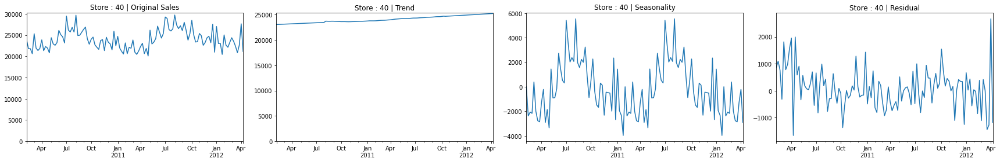

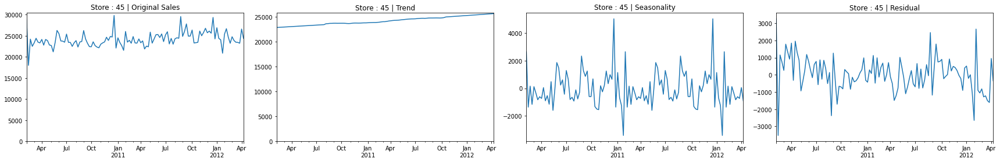

In [43]:
print("Time Series with Stationary appearance as per ADF test")
addts_decompose(project_train[storelist_st])

**Observations** : From above decomposition plots we can conclude that there is some trend present in almost all of time series.
<br>Now, we have two options:
*   Develop models to predict trend/seasonality/residual present in each of the time series using linear regression/fourier features(periodogram)/arma respectively.
*   Use auto-arima to detect p/d/q and seasonality then cross-check with the plots we have generated to see if it makes sense.

<br>Considering we have 45 time series, option two seems better feasible for now. So first of all lets prepare a dataframe with these components.

In [44]:
# Merge trends, seasonality and residuals for all stores in a single dataframe.

trend=pd.DataFrame(est_trend)
trend.columns = [str(col)+"_trend" for col in trend.columns]
seasonality=pd.DataFrame(est_seasonal)
seasonality.columns = [str(col)+"_seasonal" for col in seasonality.columns]
residual=pd.DataFrame(est_residual)
residual.columns = [str(col)+"_resid" for col in residual.columns]

project_train_decompose = pd.concat([project_train, trend, seasonality, residual], axis=1)

print("Input files being merged : ", project_train.shape, trend.shape, seasonality.shape, residual.shape)
print("Merged file : ",project_train_decompose.shape)

Input files being merged :  (115, 45) (115, 45) (115, 45) (115, 45)
Merged file :  (115, 180)


In [45]:
# Checking stationarity of original time series and additive-decomposed residual columns

print("ADF Test Result on original series :")
adf_check = check_stationarity(project_train, pval=0.05)
print(adf_check['stationary'].value_counts())
print("\nADF Test Result on residual after removing trend and seasonality :")
adf_check_resid = check_stationarity(project_train_decompose[residual.columns], pval=0.05)
print(adf_check_resid['stationary'].value_counts())

ADF Test Result on original series :
Non Stationary    23
Stationary        22
Name: stationary, dtype: int64

ADF Test Result on residual after removing trend and seasonality :
Stationary        30
Non Stationary    15
Name: stationary, dtype: int64


**Observation** : Initially we had 50% of the series stationary. Now, we have roughly 75% series stationary after decomposition. Rest could be due to adf not being fool proof method of determining stationarity.
<br>Our takeaway from this exercise should be that almost every series has *additive trend and annual seasonality*. This should be helpful in applying triple smoothing & auto-arima algorithms in the following sections.

### Step 03(a) : Time Series Model -- Triple Exponential Smoothing

In [46]:
def weighted_mae(df, w, y, y_pred):
    '''
    This function calculates weighted mean absolute error.
    The input dataframe 'df' should have weights in column 'w', targets in column 'y' and predictions in column 'p'.
    '''

    return (abs(df[y]-df[y_pred])*df[w]).sum() / df[w].sum()

In [47]:
HolidayList = sorted(list(set(train_Dept4_merge2[train_Dept4_merge2['IsHoliday']].index)))
HolidayList

[Timestamp('2010-02-12 00:00:00'),
 Timestamp('2010-09-10 00:00:00'),
 Timestamp('2010-11-26 00:00:00'),
 Timestamp('2010-12-31 00:00:00'),
 Timestamp('2011-02-11 00:00:00'),
 Timestamp('2011-09-09 00:00:00'),
 Timestamp('2011-11-25 00:00:00'),
 Timestamp('2011-12-30 00:00:00'),
 Timestamp('2012-02-10 00:00:00'),
 Timestamp('2012-09-07 00:00:00')]

WMAE for store 1 :  1692.9134129758415


<Axes: >

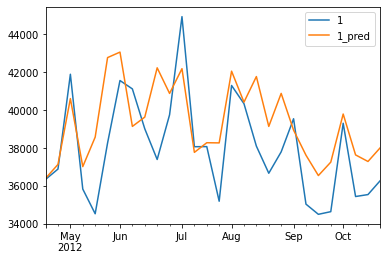

In [48]:
# Triple Exponential Smoothing for a single store

store_id = 1

triple = ExponentialSmoothing(project_train[store_id],
                              trend="additive",
                              seasonal="additive",
                              seasonal_periods=26).fit(optimized=True)
triple_preds = pd.DataFrame({
                      str(store_id) : project_test[store_id],\
                      str(store_id)+"_pred" : list(triple.forecast(len(project_test[store_id]))),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(project_test.index)))\
                      })

print("WMAE for store 1 : ", weighted_mae(triple_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred"))
triple_preds[[str(store_id), str(store_id)+"_pred"]].plot()

**Observations** : Manipulating store id and seasonal period in the above cell can quickly give an indication of better predictability with monthly and even half-yearly seasonality.
<br>Hence, using this algorithm we develop 3 models for each store with different *seasonal_periods(52, 26, 4)*. We keep the models in a model dictionary and eval results in 'final_evalscores' dataset for final comparison.

In [49]:
# Initialize final_models and final_evalscores
final_models=dict(); final_evalscores=dict()

In [50]:
# sample df for final_evalscores
pd.DataFrame({
    'model1' :{1:111, 2:111, 3:111},
    'model2' :{1:222, 2:222, 3:222},
    'model3' :{1:333, 2:333, 3:333},
})

,model1,model2,model3
1,111,222,333
2,111,222,333
3,111,222,333


In [51]:
def triple_expsm(df_train, df_test, seasonal=52, plots=False):
    '''
    This function trains a triple exponential smoothing model on data 'df_train' and evaluates it on 'df_test'.
    Both input dataframes will only have ts columns named numerically starting from 1.
    The output will be models for each of the time series in df_train and the corresponding evaluation scores using WMAE.
    If plots is set to True it will plot actuals vs predictions as well.
    '''
    models = dict(); eval_scores=dict()
    n_stores = len(df_train.columns)

    if plots:
        pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
        pltrows = math.ceil(n_stores/4)
        fig, axes = plt.subplots(pltrows, 4, figsize=(4*pltx, pltrows*plty))

    for i in range(n_stores):

        store_id = df_train.columns[i]

        triple = ExponentialSmoothing(df_train[store_id],
                              trend="additive",
                              seasonal="additive",
                              seasonal_periods=seasonal).fit(optimized=True)
        triple_preds = pd.DataFrame({
                              str(store_id) : df_test[store_id],\
                              str(store_id)+"_pred" : list(triple.forecast(len(df_test[store_id]))),\
                              'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(df_test.index)))\
                              })
        
        models.update({store_id:triple})
        eval_scores.update({store_id:weighted_mae(triple_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred")})

        if plots:
            triple_preds[[str(store_id), str(store_id)+"_pred"]].plot(ax=axes[math.floor(i/4)][i%4], title="Store : "+str(store_id)+" | Triple Exp Smoothing", ylim=0)
            fig.tight_layout()
        
    if plots:
        fig.tight_layout()
    
    return models, eval_scores

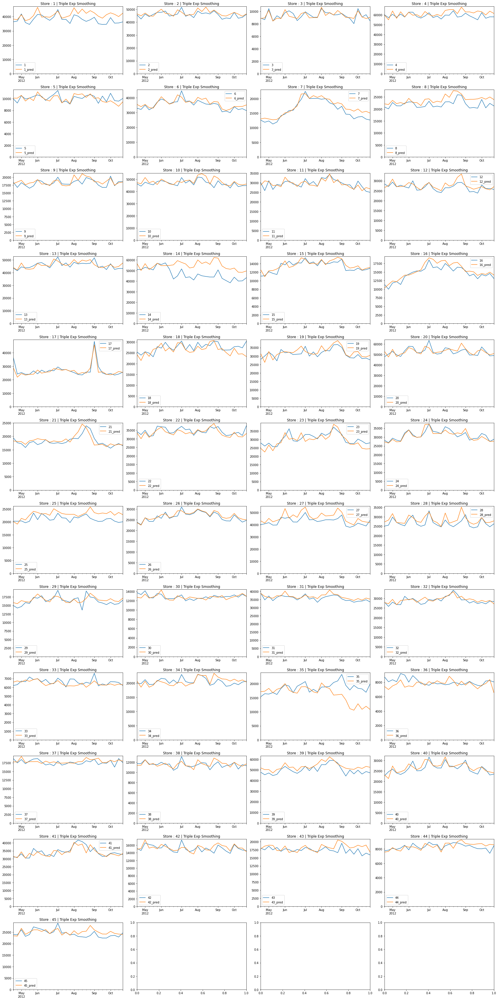

In [52]:
model_tripexp52, eval_tripexp52 = triple_expsm(project_train, project_test, seasonal=52, plots=True)

In [53]:
model_tripexp26, eval_tripexp26 = triple_expsm(project_train, project_test, seasonal=26)

In [54]:
model_tripexp4, eval_tripexp4 = triple_expsm(project_train, project_test, seasonal=4)

In [55]:
# Update the final model and eval score dictionaries
final_models.update({"TriplExp52":model_tripexp52, "TriplExp26":model_tripexp26, "TriplExp4":model_tripexp4})
final_evalscores.update({"TriplExp52":eval_tripexp52, "TriplExp26":eval_tripexp26, "TriplExp4":eval_tripexp4})

<Axes: >

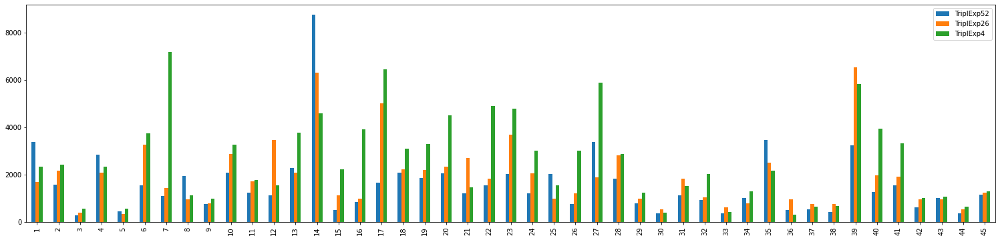

In [56]:
# Compare the 3 exponential smoothing models
pd.DataFrame(final_evalscores).plot(kind='bar', figsize=(26,6))

**Obervations** : The 3 exponential smoothing models have only one difference and that is seasonality. It seems there are some stores which have always high errors. Its possible that these stores have high sale values as well. For the rest, most of the times monthly seasonality resuts in much higher error than the rest(especially, store 14 onwards). In other cases, all 3 are quite comaprable(store 1-6, 8-14).

### Step 03(b) : Time Series Model -- Auto ARIMA with Seasonality

auto-fit order: : (1, 0, 1)
auto-fit seasonal_order: : (1, 1, 1, 12)
AIC of final selected model :  2008.6075576573871
WMAE for store 1 :  2334.500405136134


<Axes: >

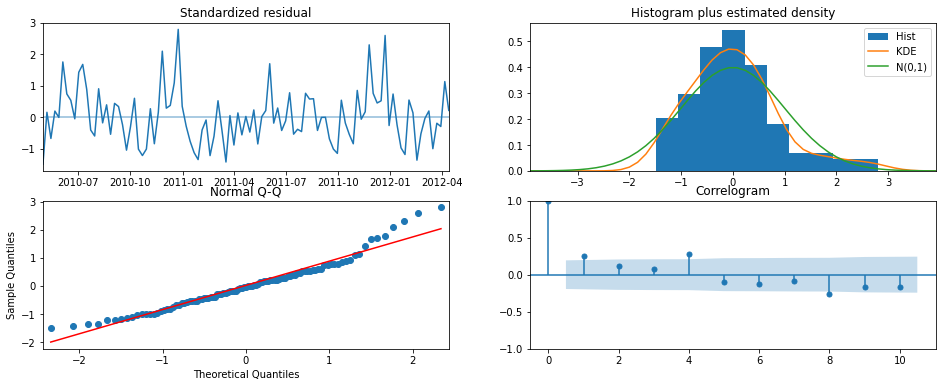

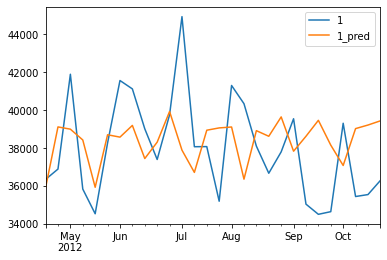

In [57]:
# Sample run for auto-arima for a single store

store_id = 1

stepwise_model = pm.auto_arima(project_train[store_id],
                               start_p=1, start_q=1, max_p=3, max_q=3, d=0,
                               seasonal=True, m=12, start_P=0, D=1, trace=False,    # set trace to True to get stepwise aic scores and model config
                               error_action='ignore', suppress_warnings=True, stepwise=True)

print('auto-fit order: :', stepwise_model.order)
print('auto-fit seasonal_order: :', stepwise_model.seasonal_order)
print("AIC of final selected model : ", stepwise_model.aic())

stepwise_model.plot_diagnostics(figsize = (16,6));

autoarima_preds = pd.DataFrame({
                      str(store_id) : project_test[store_id],\
                      str(store_id)+"_pred" : list(stepwise_model.predict(n_periods=len(project_test[store_id]))),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(project_test.index)))\
                      })

print("WMAE for store 1 : ", weighted_mae(autoarima_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred"))

autoarima_preds[[str(store_id), str(store_id)+"_pred"]].plot()

auto-fit order: : (1, 0, 1)
auto-fit seasonal_order: : (0, 1, 1, 12)
AIC of final selected model :  1666.4588408772738
WMAE for store 3 :  584.9775293129147


<Axes: >

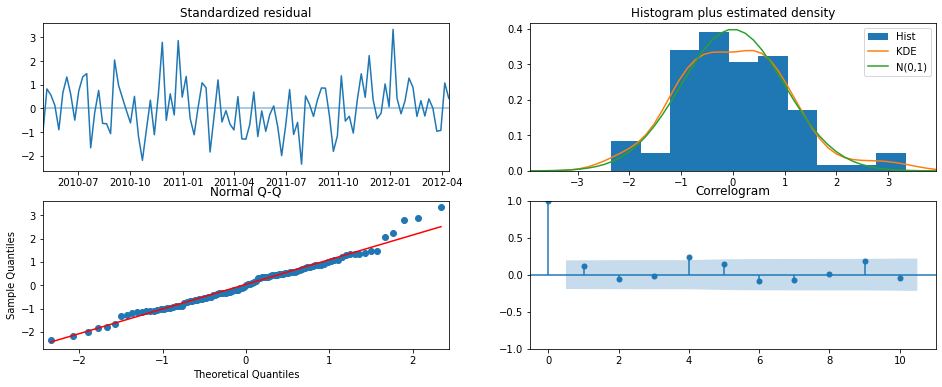

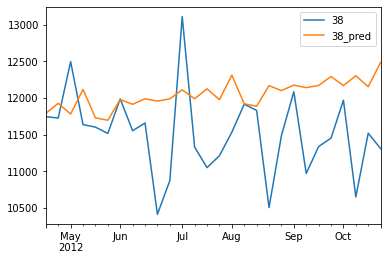

In [58]:
# Sample run for auto-arima for a single store

store_id = 38

stepwise_model = pm.auto_arima(project_train[store_id],
                               start_p=1, start_q=1, max_p=3, max_q=3, d=0,
                               seasonal=True, m=12, start_P=0, D=1, trace=False,    # set trace to True to get stepwise aic scores and model config
                               error_action='ignore', suppress_warnings=True, stepwise=True)

print('auto-fit order: :', stepwise_model.order)
print('auto-fit seasonal_order: :', stepwise_model.seasonal_order)
print("AIC of final selected model : ", stepwise_model.aic())

stepwise_model.plot_diagnostics(figsize = (16,6));

autoarima_preds = pd.DataFrame({
                      str(store_id) : project_test[store_id],\
                      str(store_id)+"_pred" : list(stepwise_model.predict(n_periods=len(project_test[store_id]))),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(project_test.index)))\
                      })

print("WMAE for store 3 : ", weighted_mae(autoarima_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred"))

autoarima_preds[[str(store_id), str(store_id)+"_pred"]].plot()

**Observations** : Experimenting a bit with above will suggest that m=12(monthly seasonality) and m=4(quaterly seasonality) are better than m=1(annual seasonality) which fails to capture any variation in the series.
<br>Residuals are deviating from normality at extremes which could perhaps be fixed through log transformations.

In [59]:
def autoarima(df_train, df_test, periods=12, plots=False):
    '''
    This function trains a seasonal arima model on data 'df_train' and evaluates it on 'df_test'. Seasonality input 'periods' is 12 for monthly seasonality and 4 for quaterly & 1 for none.
    Both input dataframes will only have ts columns named numerically starting from 1.
    The output will be models for each of the time series in df_train and the corresponding evaluation scores using WMAE.
    If plots is set to True it will plot actuals vs predictions as well.
    '''
    models = dict(); eval_scores=dict()
    n_stores = len(df_train.columns)

    if plots:
        pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
        pltrows = math.ceil(n_stores/4)
        fig, axes = plt.subplots(pltrows, 4, figsize=(4*pltx, pltrows*plty))

    for i in tqdm(range(n_stores)):

        store_id = df_train.columns[i]

        stepwise = pm.auto_arima(df_train[store_id],
                                 start_p=1, start_q=1, max_p=3, max_q=3, d=0,
                                 seasonal=True, m=periods, start_P=0, D=1, trace=False,    # set trace to True to get stepwise aic scores and model config logs
                                 error_action='ignore', suppress_warnings=True, stepwise=True)

        autoarima_preds = pd.DataFrame({
                      str(store_id) : df_test[store_id],\
                      str(store_id)+"_pred" : list(stepwise.predict(n_periods=len(df_test[store_id]))),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(df_test.index)))\
                      })
        
        models.update({store_id:stepwise})
        eval_scores.update({store_id:weighted_mae(autoarima_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred")})

        if plots:
            autoarima_preds[[str(store_id), str(store_id)+"_pred"]].plot(ax=axes[math.floor(i/4)][i%4], title="Store : "+str(store_id)+" | SARIMA", ylim=0)
            fig.tight_layout()
        
    if plots:
        fig.tight_layout()
    
    return models, eval_scores

100%|██████████| 45/45 [34:17<00:00, 45.73s/it]


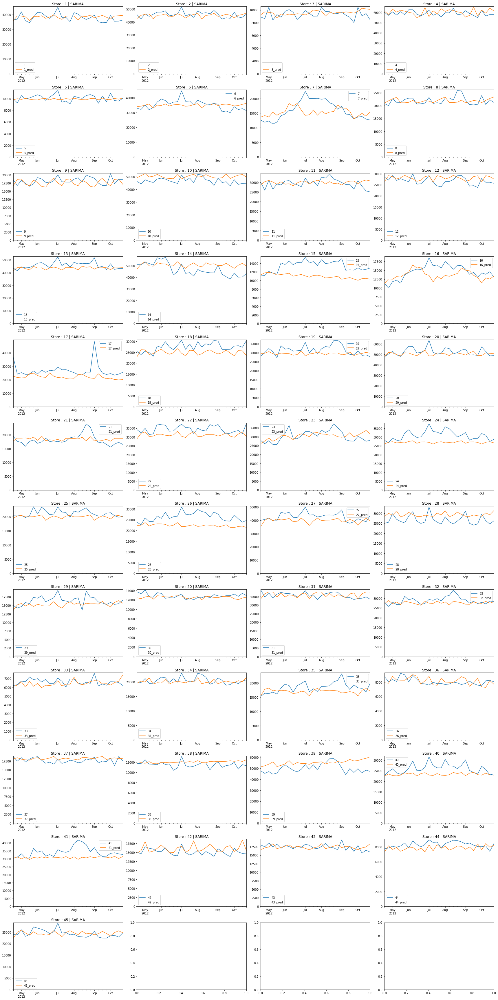

In [60]:
model_sarima12, eval_sarima12 = autoarima(project_train, project_test, periods=12, plots=True)

In [61]:
model_sarima4, eval_sarima4 = autoarima(project_train, project_test, periods=4)

100%|██████████| 45/45 [09:31<00:00, 12.69s/it]


In [62]:
# Update the final model and eval score dictionaries
final_models.update({"SARIMA12":model_sarima12, "SARIMA4":model_sarima4})
final_evalscores.update({"SARIMA12":eval_sarima12, "SARIMA4":eval_sarima4})

<Axes: >

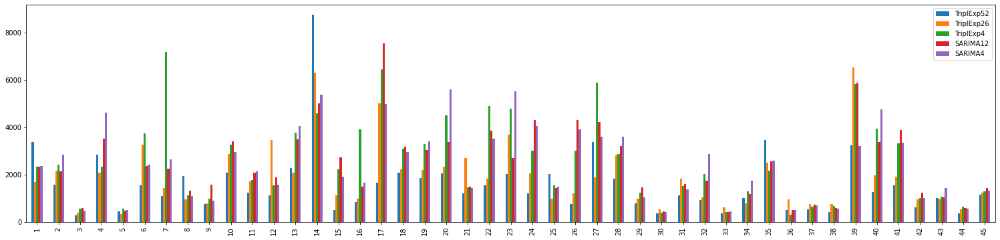

In [63]:
# Compare the 2 sarima models with other 3 exp. smoothing models
pd.DataFrame(final_evalscores).plot(kind='bar', figsize=(26,6))

**Observations** : The new sarima models we just added have very high errors. Auto-arima is more of a brute force method and we are also trying to throw original series with trend and seasonality into it. Perhaps log transfor mwould have reduced variations by some degree. Also, the default maximum order of model autoarima attempts to fit is 5.
<br>Due to above reasons it might not have been able to capture the variations in a lot of series as we see above. Perhaps a more sophisticted algorithm like Prophet might be able to perform better.

### Step 03(c) : Time Series Model -- Prophet

In [64]:
# add holidays of all categories separately

superbowls = pd.DataFrame({
  'holiday': 'SuperBowl',
  'ds': pd.to_datetime(['2010-02-12', '2011-02-11', '2012-02-10']),
  'lower_window': 0, 'upper_window': 1    # these help us specify spillover into previous and future days which will be treated as own holidays
})

laborday = pd.DataFrame({
  'holiday': 'LaborDay',
  'ds': pd.to_datetime(['2010-09-10', '2011-09-09', '2012-09-07']),
  'lower_window': 0, 'upper_window': 1
})

thanksgiving = pd.DataFrame({
  'holiday': 'Thanksgiving',
  'ds': pd.to_datetime(['2010-11-26', '2011-11-25']),
  'lower_window': 0, 'upper_window': 1
})

christmas = pd.DataFrame({
  'holiday': 'Christmas',
  'ds': pd.to_datetime(['2010-12-31', '2011-12-30']),
  'lower_window': 0, 'upper_window': 1
})

holidays = pd.concat((superbowls, laborday, thanksgiving, christmas))
holidays

,holiday,ds,lower_window,upper_window
0,SuperBowl,2010-02-12,0,1
1,SuperBowl,2011-02-11,0,1
2,SuperBowl,2012-02-10,0,1
0,LaborDay,2010-09-10,0,1
1,LaborDay,2011-09-09,0,1
2,LaborDay,2012-09-07,0,1
0,Thanksgiving,2010-11-26,0,1
1,Thanksgiving,2011-11-25,0,1
0,Christmas,2010-12-31,0,1
1,Christmas,2011-12-30,0,1


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/a5idq5gg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/84ev7wte.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71353', 'data', 'file=/tmp/tmplfy3m6tx/a5idq5gg.json', 'init=/tmp/tmplfy3m6tx/84ev7wte.json', 'output', 'file=/tmp/tmplfy3m6tx/prophet_model3j5bl35y/prophet_model-20230317060654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:06:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:06:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


WMAE for store 1 :  1818.1699274368298


,ds,holidays,Christmas,LaborDay,Thanksgiving,SuperBowl
1,2010-02-12,-864.046552,0.000000,0.000000,0.00000,-864.046552
31,2010-09-10,1104.077842,0.000000,1104.077842,0.00000,0.000000
42,2010-11-26,9859.635580,0.000000,0.000000,9859.63558,0.000000
47,2010-12-31,-7596.057851,-7596.057851,0.000000,0.00000,0.000000
53,2011-02-11,-864.046552,0.000000,0.000000,0.00000,-864.046552
83,2011-09-09,1104.077842,0.000000,1104.077842,0.00000,0.000000
94,2011-11-25,9859.635580,0.000000,0.000000,9859.63558,0.000000
99,2011-12-30,-7596.057851,-7596.057851,0.000000,0.00000,0.000000
105,2012-02-10,-864.046552,0.000000,0.000000,0.00000,-864.046552
135,2012-09-07,1104.077842,0.000000,1104.077842,0.00000,0.000000


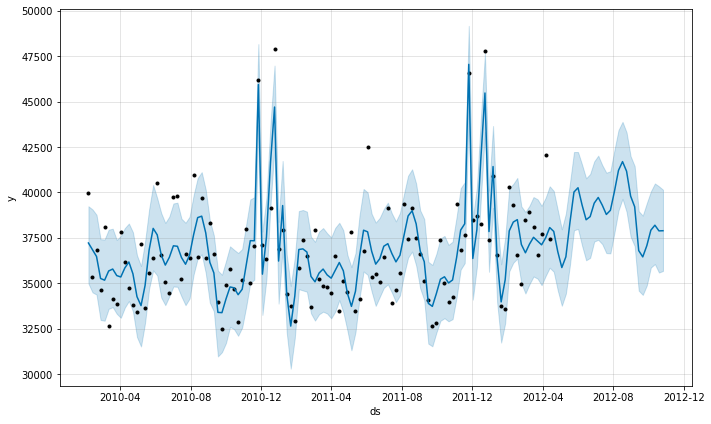

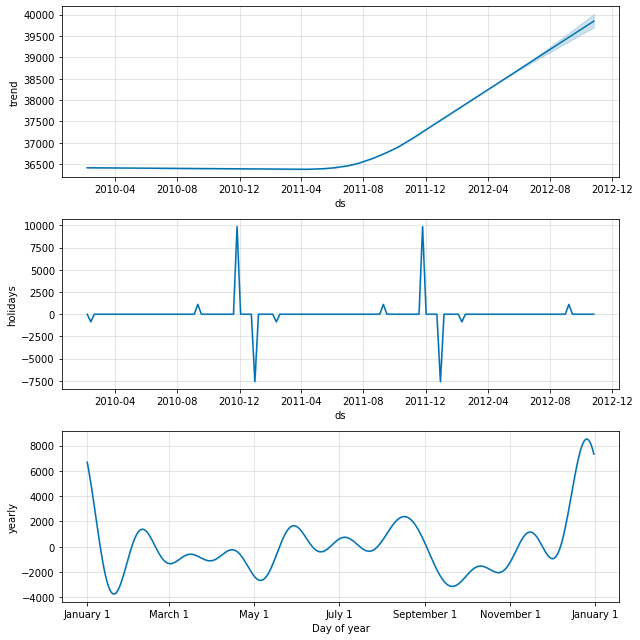

In [65]:
store_id = 1

prophet_train = pd.DataFrame({'ds' : list(project_train.index), 'y': list(project_train[store_id])})
fbproft = Prophet(holidays=holidays)
fbproft.fit(prophet_train)

future = fbproft.make_future_dataframe(periods=len(project_test[store_id]), freq='W-FRI')   # freq can be any freq valid in pd.date_range
fbproft_pred = fbproft.predict(future)

fbproft.plot(fbproft_pred);   # plot forecast
fbproft.plot_components(fbproft_pred);    # plot individual components of forecast: trend, weekly/yearly seasonality etc

fbproft_preds = pd.DataFrame({
                      str(store_id) : project_test[store_id],\
                      str(store_id)+"_pred" : list(fbproft_pred['yhat'][-len(project_test.index):]),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(project_test.index)))\
                      })

print("WMAE for store 1 : ", weighted_mae(fbproft_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred"))

# we can see the effects of various 'holidays' on site visits
fbproft_pred[(fbproft_pred['holidays']!=0)][['ds', 'holidays', 'Christmas', 'LaborDay', 'Thanksgiving', 'SuperBowl']]

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/eay2b8gj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/e2qqqjvf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47810', 'data', 'file=/tmp/tmplfy3m6tx/eay2b8gj.json', 'init=/tmp/tmplfy3m6tx/e2qqqjvf.json', 'output', 'file=/tmp/tmplfy3m6tx/prophet_modelod4s69_4/prophet_model-20230317060703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:07:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:07:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


WMAE for store 1 :  2296.7618871067607


,ds,holidays,Christmas,LaborDay,Thanksgiving,SuperBowl
1,2010-02-12,598.469013,0.000000,0.000000,0.000000,598.469013
31,2010-09-10,1484.910439,0.000000,1484.910439,0.000000,0.000000
42,2010-11-26,11442.985764,0.000000,0.000000,11442.985764,0.000000
47,2010-12-31,-7860.045335,-7860.045335,0.000000,0.000000,0.000000
53,2011-02-11,598.469013,0.000000,0.000000,0.000000,598.469013
83,2011-09-09,1484.910439,0.000000,1484.910439,0.000000,0.000000
94,2011-11-25,11442.985764,0.000000,0.000000,11442.985764,0.000000
99,2011-12-30,-7860.045335,-7860.045335,0.000000,0.000000,0.000000
105,2012-02-10,598.469013,0.000000,0.000000,0.000000,598.469013
135,2012-09-07,1484.910439,0.000000,1484.910439,0.000000,0.000000


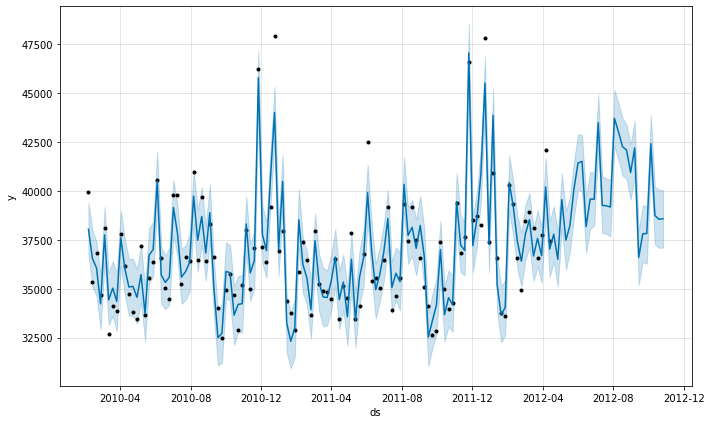

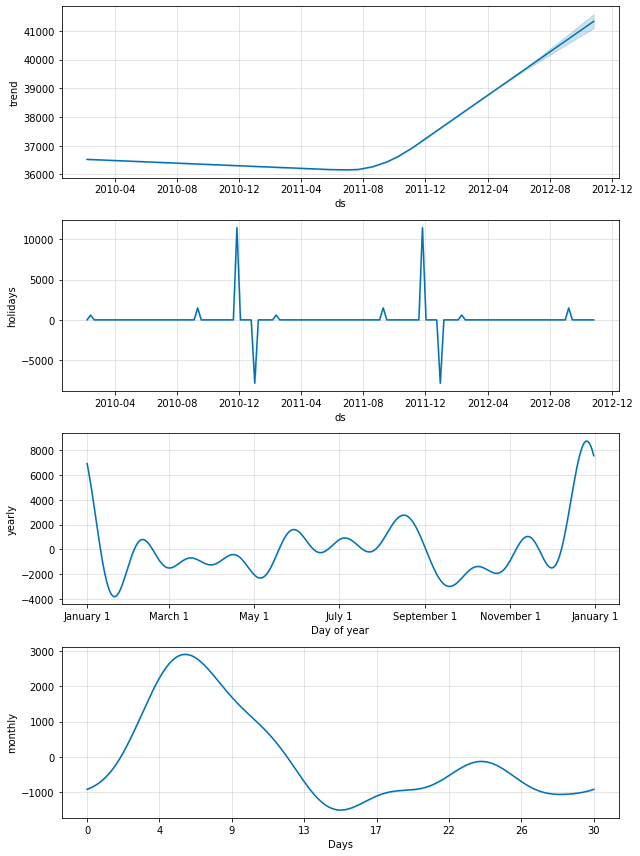

In [66]:
store_id = 1

prophet_train = pd.DataFrame({'ds' : list(project_train.index), 'y': list(project_train[store_id])})
fbproft = Prophet(holidays=holidays)
fbproft.add_seasonality(name='monthly', period=30.5, fourier_order=5)   # Add in another seasonality besides yearly, weekly, daily
fbproft.fit(prophet_train)

future = fbproft.make_future_dataframe(periods=len(project_test[store_id]), freq='W-FRI')   # freq can be any freq valid in pd.date_range
fbproft_pred = fbproft.predict(future)

fbproft.plot(fbproft_pred);   # plot forecast
fbproft.plot_components(fbproft_pred);    # plot individual components of forecast: trend, weekly/yearly seasonality etc

fbproft_preds = pd.DataFrame({
                      str(store_id) : project_test[store_id],\
                      str(store_id)+"_pred" : list(fbproft_pred['yhat'][-len(project_test.index):]),\
                      'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(project_test.index)))\
                      })

print("WMAE for store 1 : ", weighted_mae(fbproft_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred"))

# we can see the effects of various 'holidays' on site visits
fbproft_pred[(fbproft_pred['holidays']!=0)][['ds', 'holidays', 'Christmas', 'LaborDay', 'Thanksgiving', 'SuperBowl']]

**Obervations** : We see how Prophet manages to predict impact of holidays separately in above two cells. From above, we can also conclude that it would be better to keep monthly seasonality as well.

In [67]:
def ts_fbproft(df_train, df_test, monthly=False, plots=False):
    '''
    This function trains a Prophet model on data 'df_train' and evaluates it on 'df_test'. Seasonality input 'monthly' is set to True to model for monthly seasonality as well, otherwise ignored.
    Both input dataframes will only have ts columns named numerically starting from 1.
    The output will be models for each of the time series in df_train and the corresponding evaluation scores using WMAE.
    If plots is set to True it will plot actuals vs predictions as well.
    '''
    models = dict(); eval_scores=dict()
    n_stores = len(df_train.columns)

    if plots:
        pltx = plt.rcParams["figure.figsize"][0]; plty = plt.rcParams["figure.figsize"][1]
        pltrows = math.ceil(n_stores/4)
        fig, axes = plt.subplots(pltrows, 4, figsize=(4*pltx, pltrows*plty))

    for i in tqdm(range(n_stores)):

        store_id = df_train.columns[i]

        prophet_train = pd.DataFrame({'ds' : list(df_train.index), 'y': list(df_train[store_id])})
        fbproft = Prophet(holidays=holidays)
        if monthly:
            fbproft.add_seasonality(name='monthly', period=30.5, fourier_order=5)   # Add in another seasonality besides yearly, weekly, daily
        fbproft.fit(prophet_train)

        future = fbproft.make_future_dataframe(periods=len(df_test[store_id]), freq='W-FRI')   # freq can be any freq valid in pd.date_range
        fbproft_pred = fbproft.predict(future)
        
        fbproft_preds = pd.DataFrame({
                              str(store_id) : df_test[store_id],\
                              str(store_id)+"_pred" : list(fbproft_pred['yhat'][-len(df_test.index):]),\
                              'IsHoliday' : list(map(lambda x: 5 if x in HolidayList else 1, list(df_test.index)))\
                              })

        models.update({store_id:fbproft})
        eval_scores.update({store_id:weighted_mae(fbproft_preds, 'IsHoliday', str(store_id), str(store_id)+"_pred")})

        if plots:
            fbproft_preds[[str(store_id), str(store_id)+"_pred"]].plot(ax=axes[math.floor(i/4)][i%4], title="Store : "+str(store_id)+" | Prophet", ylim=0)
            fig.tight_layout()
        
    if plots:
        fig.tight_layout()
    
    return models, eval_scores

  0%|          | 0/45 [00:00<?, ?it/s]INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/xo4f8m3o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/_fzarvbb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60410', 'data', 'file=/tmp/tmplfy3m6tx/xo4f8m3o.json', 'init=/tmp/tmplfy3m6tx/_fzarvbb.json', 'output', 'file=/tmp/tmplfy3m6tx/prophet_modelha68r6y2/prophet_model-20230317061931.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:19:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:19:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
  2

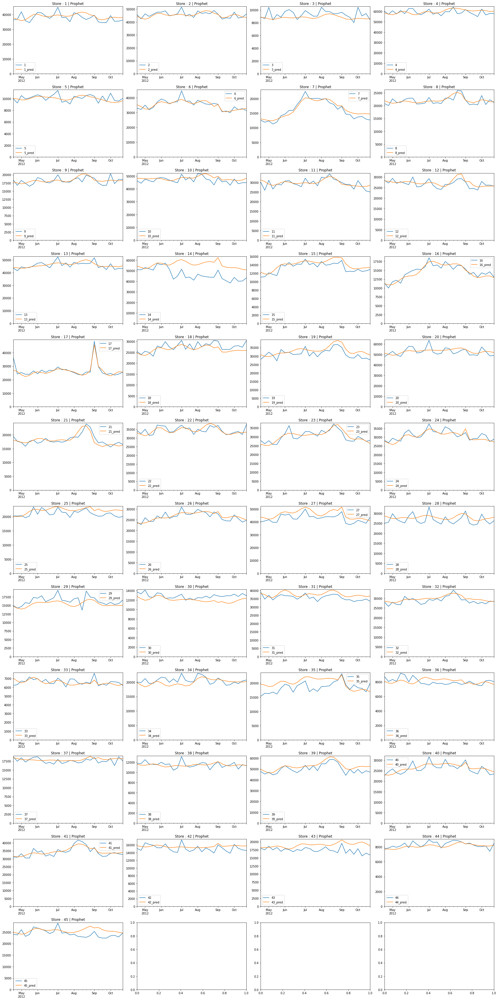

In [68]:
model_proft_nomth, eval_proft_nomth = ts_fbproft(project_train, project_test, plots=True)

In [69]:
model_proft_mth, eval_proft_mth = ts_fbproft(project_train, project_test, monthly=True)

  0%|          | 0/45 [00:00<?, ?it/s]INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/ithknnyo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplfy3m6tx/mk3_qe1o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43830', 'data', 'file=/tmp/tmplfy3m6tx/ithknnyo.json', 'init=/tmp/tmplfy3m6tx/mk3_qe1o.json', 'output', 'file=/tmp/tmplfy3m6tx/prophet_model8bfmh_w6/prophet_model-20230317062212.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:22:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:22:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
  2

In [70]:
# Update the final model and eval score dictionaries
final_models.update({"Prophet_nomth":model_proft_nomth, "Prophet_mth":model_proft_mth})
final_evalscores.update({"Prophet_nomth":eval_proft_nomth, "Prophet_mth":eval_proft_mth})

<Axes: >

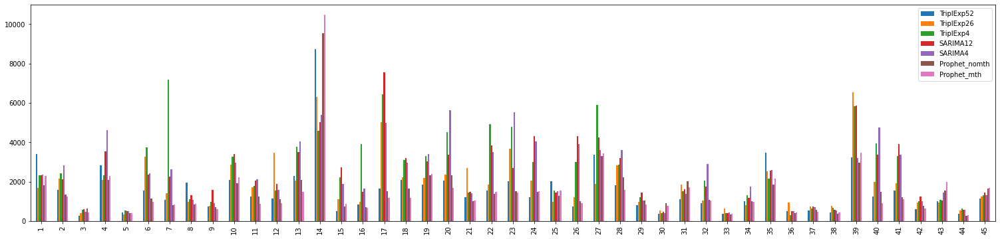

In [71]:
# Compare the 2 prophet models with other models
pd.DataFrame(final_evalscores).plot(kind='bar', figsize=(26,6))

**Observations** : Except a few cases, Prophet models are either better than other models or comparable when looked ar WMAE scores. This is to be expected because this is the only model that factors in holidays to model their effect separately.

### Step 04 : Evaluation of all available models

In [72]:
def minscorecol(x):
    '''
    This function takes the input series 'x' and returns the index of series with minimum value.
    '''
    num_indexmin = np.argmin(x)
    return x.index[num_indexmin]

df_final_evalscores = pd.DataFrame(final_evalscores)
df_final_evalscores['BestModel'] = df_final_evalscores.apply(minscorecol, axis=1)
df_final_evalscores['BestModelScore'] = df_final_evalscores.min(axis=1)
df_final_evalscores.head()

,TriplExp52,TriplExp26,TriplExp4,SARIMA12,SARIMA4,Prophet_nomth,Prophet_mth,BestModel,BestModelScore
1,3393.669063,1692.913413,2333.228533,2334.500405,2360.146614,1818.169927,2296.761887,TriplExp26,1692.913413
2,1587.426326,2168.506262,2416.011869,2136.265783,2849.340633,1338.183438,1261.921441,Prophet_mth,1261.921441
3,278.960409,409.090008,563.147285,592.048697,487.110836,628.897812,442.450428,TriplExp52,278.960409
4,2840.278758,2080.891880,2338.962011,3525.345879,4608.012042,2100.491230,2294.124202,TriplExp26,2080.891880
5,449.699428,348.057461,552.227887,492.350575,508.652493,400.366802,392.914701,TriplExp26,348.057461


<Axes: >

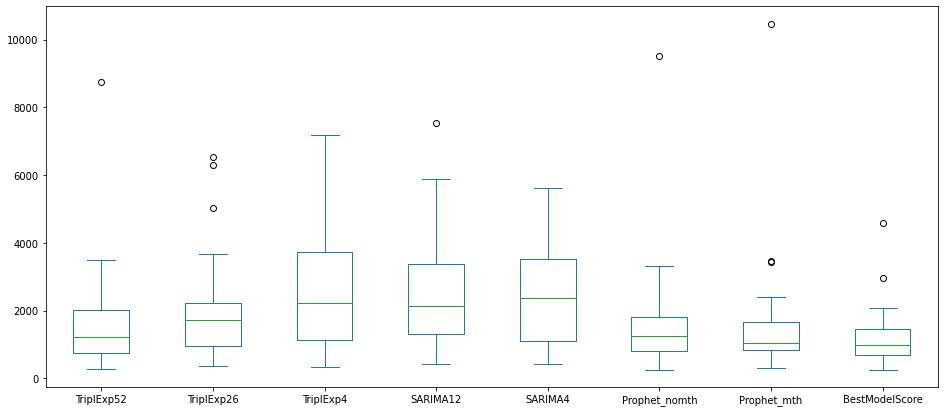

In [73]:
df_final_evalscores.plot(kind='box', figsize=(16,7))

In [74]:
df_final_evalscores['BestModel'].value_counts().reset_index().rename(columns={'index':'BestModel', 'BestModel':'Count'})

,BestModel,Count
0,Prophet_mth,15
1,TriplExp52,11
2,Prophet_nomth,10
3,TriplExp26,7
4,TriplExp4,2


### Project Conclusion : Key Findings & Insights

**Key Findings** : Based on WMAE scores for all the stores' sales we can conclude below:

*   Median WMAE score across all the stores is minimum for 'Triple Exponential Smoothing' with annual seasonality and both the 'Prophet' models.
*   Variation of WMAE score is least in 'Prophet' with monthly seasonality but both the Prophet models have some extreme outliers.
*   'SARIMA' models obtained with auto-arima and 'Triple Exponential Smoothing' model with monthly seasonality have a lot of variation in WMAE scores and also have a comparatively higher median score than the rest mentioned above.
*   More than half of the stores have 'Prophet' as the best model. Second to that is 'Triple Exponential Smoothing' model with annual seasonality.
*   Best model has a very low median and variation in WMAE scores. Only a few outlier stores have a score of 2000+, 95% of the stores have a score of less than 2000.

**Final Conclusion** :
* We started with 45 stores' sales time series, each having its own distinct trend and seasonality pattern. Additive Decomposition showed us better improvement in stationarity and also gave an indication of how time-series components look like in each of them.
* We developed a total of 7 models for each of the 45 stores using 3 specific algorithms namely Triple Exponential Smoothing, SARIMA and Prophet. We also looked into the possibility of annual, weekly and monthly seasonality wherever possible.
*In the end, we compared WMAE(Weighted Mean Absolute Error) scores for all the models. This led us to the conclusion that out of 7 models Prophet stood out as the one with best score in more than half of the stores. The best model has a very good score(less error) as compared to what we even obtained with the auto-arima process.

### Project Conclusion : Future Improvements

**Future Improvements** : We can still make several improvements to the models trained above. Below are some of the ideas for improvement.
* Train Exponential Smoothing & auto-arima on log transform and/or train it on exogenous variables to improve result. Log transformation will deal with outliers and exogenous variabls will add more info to train the models on.
* Use linear Regression on trend, fourier components(coupled with periodograms) on seasonality & arma on stationary residuals to make the most of decomposition components.
* Prophet can be improved further with addition of more holidays, more independent features like unemployment, promo codes, fuel prices, weather etc present in the original input data.
* If GPU is available, try RNN/LSTM to see if this improves the predictability.